In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
# Please ignore this notebook for now. I don't think this is bugfree code.

In [3]:
import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt
import sys

import visualization as v
import solution
import drandom

sys.path.append('../')
import commons
from commons.factor import Factor

In [4]:
def visualise_window_stats(chains, variables, window_size):
    grid_size = int(np.ceil(np.sqrt(len(variables))))
    fig, axs = plt.subplots(grid_size, grid_size, squeeze=False, figsize=(grid_size*20, grid_size*15))
    axs = axs.ravel()
    
    for j in variables:
        for i, chain in enumerate(chains):
            draws_j = (chain[:, j] == 1).astype(int)
            draws_j = v.smooth(draws_j, window_size)
            draws_j = draws_j[window_size//2+1: -window_size//2+1]
            axs[j].plot(draws_j, label=f'Chain-{i}')
        axs[j].set_title(f'Variable {j}')
        axs[j].legend()

In [8]:
mat = loadmat('./data/toys.mat', simplify_cells=True)
G1 = mat['net1']
G1['adj_list'] = commons.adj_matrix_to_adj_list(G1['edges'])
G1['card'] = G1['card'].astype(int)
G1['var2factors'] = np.array([(x - 1).astype(int) for x in G1['var2factors']], dtype='object')
F1 = np.array([Factor.from_matlab(f) for f in mat['fac1']])

G2 = mat['net2']
G2['adj_list'] = commons.adj_matrix_to_adj_list(G2['edges'])
G2['card'] = G2['card'].astype(int)
G2['var2factors'] = np.array([(x - 1).astype(int) for x in G2['var2factors']], dtype='object')
F2 = np.array([Factor.from_matlab(f) for f in mat['fac2']])

In [12]:
trans = ['Gibbs', 'MHUniform', 'MHSwendsenWang1', 'MHSwendsenWang1']
drandom.disable = True
samples1, samples2 = {}, {}
for t in trans:
    s = []
    for chain in range(4):
        A = (np.random.rand(len(G1['card'])) > .5).astype(int)
        M, all_samps = solution.mcmc_inference(G1, F1, None, t, 0, 4000, 1, A)
        s.append(all_samps)
    samples1[t] = s
    
    s = []
    for chain in range(4):
        A = (np.random.rand(len(G2['card'])) > .5).astype(int)
        M, all_samps = solution.mcmc_inference(G2, F2, None, t, 0, 4000, 1, A)
        s.append(all_samps)
    samples2[t] = s

Running the markov chain.: 100%|██████████| 4000/4000 [00:06<00:00, 629.19it/s]


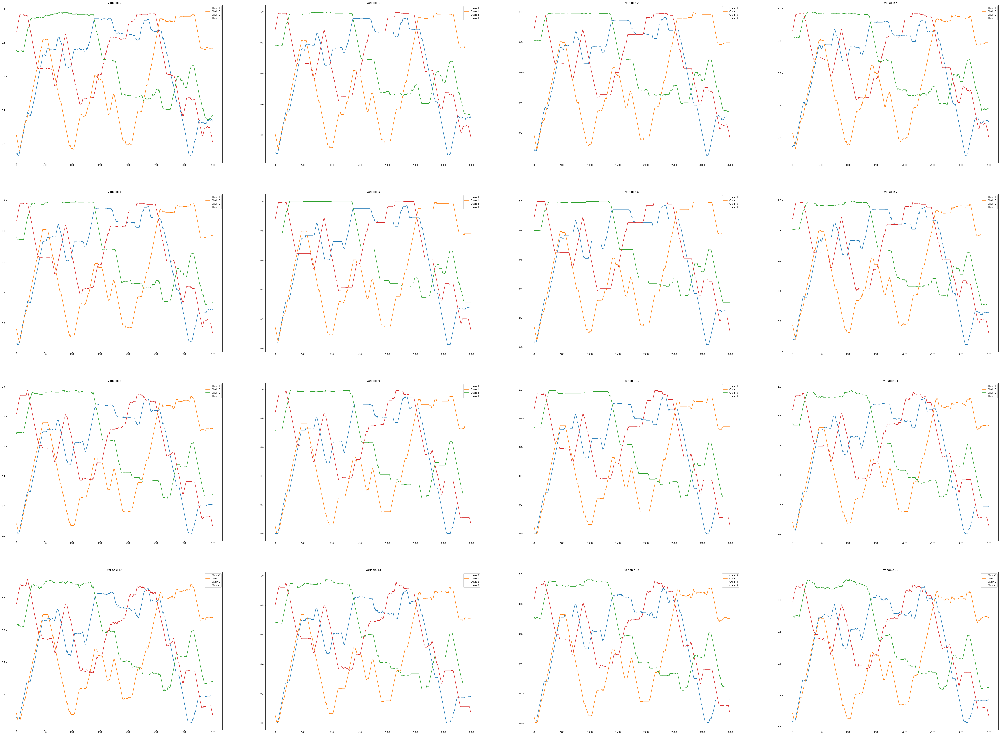

In [13]:
visualise_window_stats(samples1[trans[0]], list(range(16)), 500)

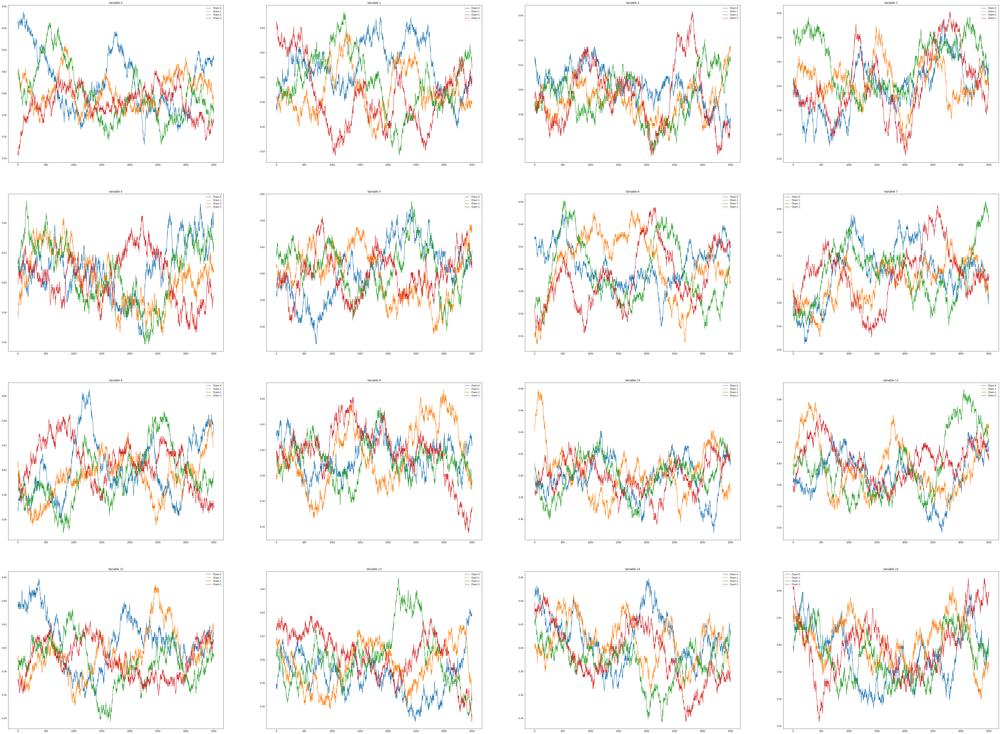

In [15]:
visualise_window_stats(samples2[trans[0]], list(range(16)), 500)

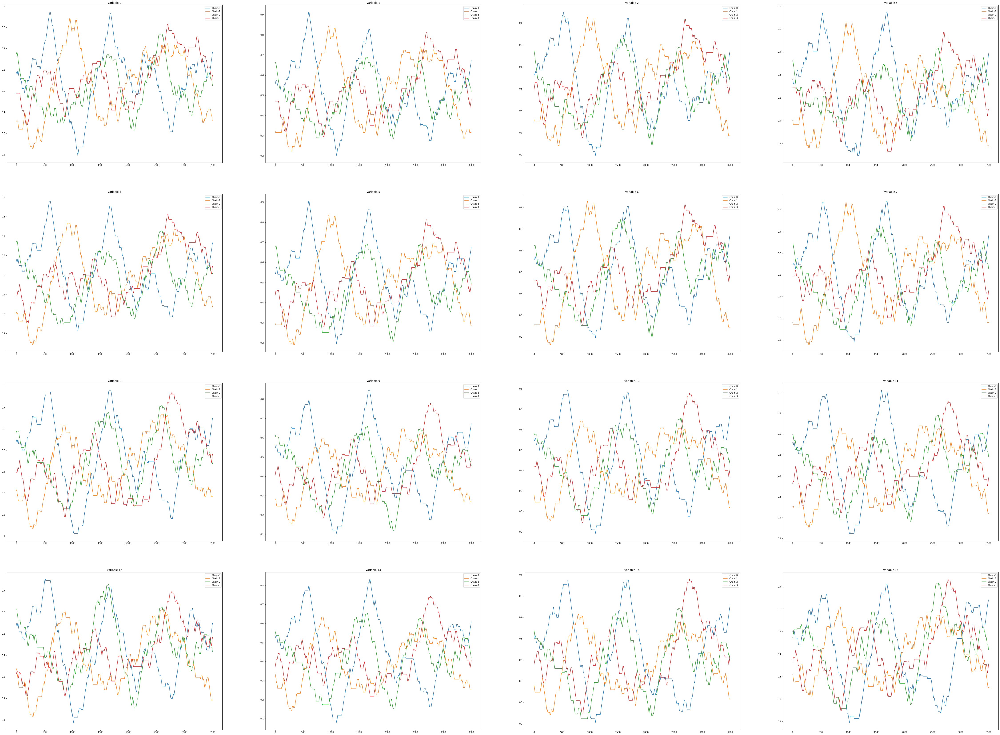

In [17]:
visualise_window_stats(samples1[trans[3]], list(range(16)), 500)

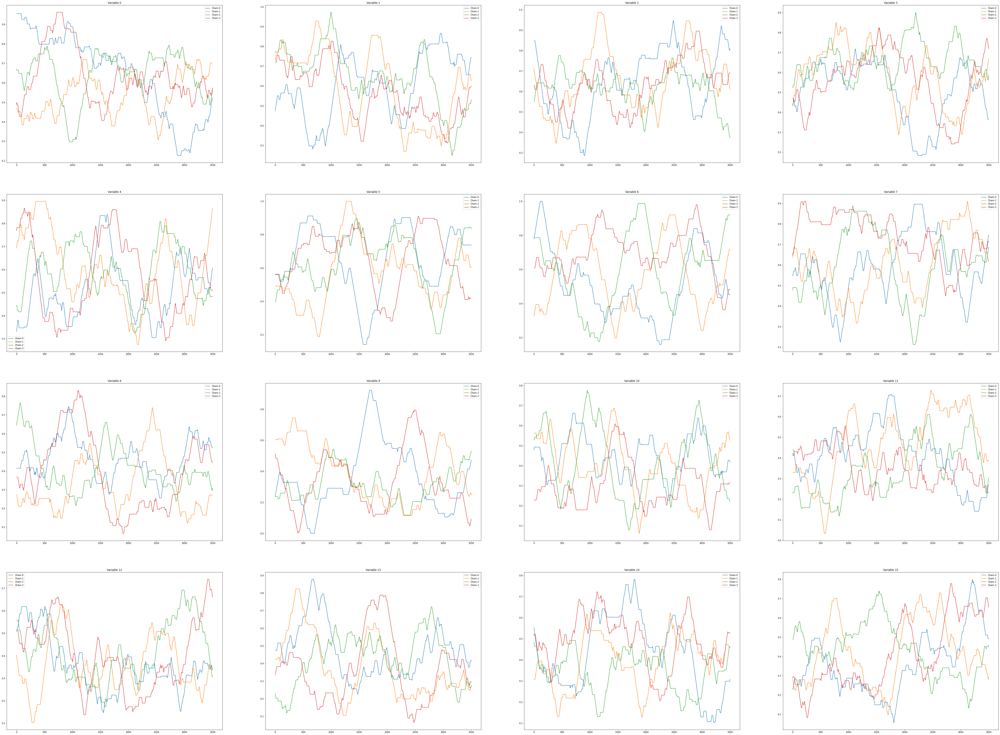

In [18]:
visualise_window_stats(samples2[trans[3]], list(range(16)), 500)